In [1]:
import tensorflow as tf
import dlmodels
import numpy as np
import h5py
import matplotlib as mpl
import matplotlib.pyplot as plt
import os
from tqdm import tqdm

In [2]:
TRAIN_DATASET_PATH = os.path.join("<path/to/data/folder>", "train_dataset.hdf5")
VAL_DATASET_PATH = os.path.join("<path/to/data/folder>", "val_dataset.hdf5")
TEST_DATASET_PATH = os.path.join("<path/to/data/folder>", "test_dataset.hdf5")
MODEL_PATH = "unet.hdf5"

In [3]:
BANDS_COUNT = 6 + 2 + 2 # optical bands + dem-slope + 2 SAR intensities (single-pol asc-desc)
CLASSES_COUNT = 2 # glacier + non-glacier
PATCH_SIZE = 256
BATCH_SIZE = 8

In [7]:
train_dataset = h5py.File(TRAIN_DATASET_PATH, "r")
val_dataset = h5py.File(VAL_DATASET_PATH, "r")
test_dataset = h5py.File(TEST_DATASET_PATH, "r")

In [8]:
def groundtruth_to_onehot():
    def transform(patch):
        height, width, depth = patch.shape
        transformed = np.zeros((height, width, depth - 1 + CLASSES_COUNT))
        transformed[:, :, :-CLASSES_COUNT] = patch[:, :, :-1]
        for class_index in range(CLASSES_COUNT):
            slice_index = class_index - CLASSES_COUNT
            transformed[:, :, slice_index][patch[:, :, -1] == class_index] = 1
        return transformed
    return transform


def stretch_features_to_range(mins, maxs):
    def transform(patch):
        transformed = np.empty(patch.shape)
        transformed[:, :, -CLASSES_COUNT:] = patch[:, :, -CLASSES_COUNT:]
        transformed[:, :, :-CLASSES_COUNT] = (patch[:, :, :-CLASSES_COUNT] - mins) / (maxs - mins)
        return transformed
    return transform


def random_vertical_flip(p=0.5):
    def transform(patch):
        if np.random.random() > p:
            return patch
        transformed = np.flip(patch, axis=0)
        return transformed
    return transform


def random_horizontal_flip(p=0.5):
    def transform(patch):
        if np.random.random() > p:
            return patch
        transformed = np.flip(patch, axis=1)
        return transformed
    return transform


def random_rotation(p=0.5):
    def transform(patch):
        if np.random.random() > p:
            return patch
        k = np.random.choice([1, 2, 3])
        transformed = np.rot90(patch, k, axes=(1, 0))
        return transformed
    return transform

In [10]:
class TrainSequence(tf.keras.utils.Sequence):
    def __init__(self, dataset, batch_size, patch_size, len, transformations=None):
        self.dataset = dataset
        self.batch_size = batch_size
        self.patch_size = patch_size
        self.len = len
        self.transformations = transformations
        self.index_dataset()

    def index_dataset(self):
        self.images = []

        self.mins = np.empty(BANDS_COUNT)
        self.maxs = np.empty(BANDS_COUNT)
        self.mins[:] = np.inf
        self.maxs[:] = -np.inf
        
        ___count = 0
        print("Reading...")
        with tqdm(total=len(self.groups)) as pbar:
            for group in self.dataset.groups:
                tile_data = self.dataset[group]
                optical = tile_data["optical"]

                height, width, _ = optical.shape
                stack = np.zeros((height, width, BANDS_COUNT + 1))
                stack[:, :, 0:6] = optical

                dem = tile_data["dem"]
                stack[:, :, 6] = dem[:, :, 0]
                slope = tile_data["slope"]
                stack[:, :, 7] = slope[:, :, 0]

                dem = tile_data["dem"]
                stack[:, :, 6] = dem[:, :, 0]
                slope = tile_data["slope"]
                stack[:, :, 7] = slope[:, :, 0]

                groundtruth = tile_data["groundtruth"]
                stack[:, :, -1] = groundtruth[:, :, 0]

                mins = stack.min(axis=(0, 1))
                maxs = stack.max(axis=(0, 1))
                self.mins = np.minimum(self.mins, mins[:BANDS_COUNT])
                self.maxs = np.maximum(self.maxs, maxs[:BANDS_COUNT])

                self.images.append(stack)
                pbar.update(1)
                ___count += 1
                    
        print("Padding...")
        with tqdm(total=len(self.images)) as pbar:
            for image_index in range(len(self.images)):
                image = self.pad(self.images[image_index])
                self.images[image_index] = image
                pbar.update(1)
                
    def pad(self, image):
        height, width, _ = image.shape
        target_height = self.patch_size * int(height // self.patch_size + 1)
        target_width = self.patch_size * int(width // self.patch_size + 1)
        pad_height = (target_height - height) // 2
        pad_width = (target_width - width) // 2
        padded = np.concatenate((self.mins, [0]))[np.newaxis, np.newaxis, :]
        padded = np.repeat(padded, target_height, axis=0)
        padded = np.repeat(padded, target_width, axis=1)
        padded[pad_height:pad_height + height, pad_width:pad_width + width, :] = image
        return padded

    def __len__(self):
        return self.len

    def __getitem__(self, idx):
        batch = self.sample()
        batch_x = batch[:, :, :, :-CLASSES_COUNT]
        batch_y = batch[:, :, :, -CLASSES_COUNT:]
        inputs = {}
        inputs["optical"] = batch_x[:, :, :, [0, 1, 2, 3, 4, 5]]
        inputs["dem"] = batch_x[:, :, :, [6, 7]]
        inputs["sar_intensities"] = batch_x[:, :, :, [8, 9]]
        return inputs, batch_y

    def sample(self):
        batch = np.empty((self.batch_size, self.patch_size, self.patch_size, BANDS_COUNT + CLASSES_COUNT))
        for patch_index in range(self.batch_size):
            image = self.sample_image()
            patch = self.sample_patch(image)
            patch = self.apply_transformations(patch)
            batch[patch_index] = patch
        return batch

    def sample_image(self):
        image_index = np.random.choice(len(self.images))
        image = self.images[image_index]
        return image

    def sample_patch(self, image):
        height, width, _ = image.shape
        y = np.random.choice(height - self.patch_size)
        x = np.random.choice(width - self.patch_size)
        patch = image[y:y + self.patch_size, x:x + self.patch_size, :]
        return patch

    def apply_transformations(self, patch):
        if not self.transformations:
            return patch
        for transformation in self.transformations:
            patch = transformation(patch)
        return patch

In [11]:
train_sequence = TrainSequence(train_dataset, BATCH_SIZE, PATCH_SIZE, 250)
MINS = train_sequence.mins
MAXS = train_sequence.maxs
train_sequence.transformations = [
    groundtruth_to_onehot(),
    stretch_features_to_range(MINS, MAXS),
    random_vertical_flip(p=0.5),
    random_horizontal_flip(p=0.5),
    random_rotation(p=0.5)
]

Reading...


100%|███████████████████████████████████████████████████████████████| 178/178 [05:38<00:00,  1.90s/it]


Padding...


100%|███████████████████████████████████████████████████████████████| 178/178 [00:09<00:00, 19.18it/s]


[]

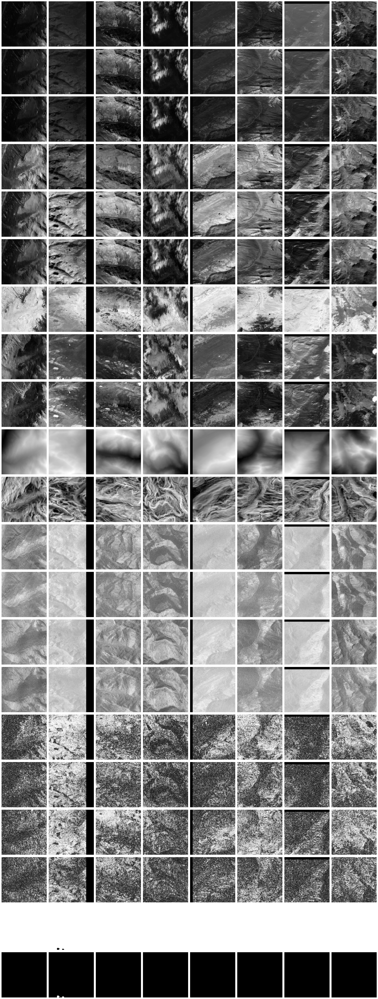

In [12]:
x_, y = train_sequence[0]
x = np.concatenate((x_["optical"], x_["dem"], x_["sar_intensities"]), axis=-1)

nrows, ncols = BANDS_COUNT + CLASSES_COUNT, BATCH_SIZE
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(3*ncols, 3*nrows))

for index, (x_item, y_item) in enumerate(zip(x, y)):
    for row in range(BANDS_COUNT):
        axes[row][index].imshow(x_item[:, :, row], cmap="gray")
        axes[row][index].axis("off")
    for class_index in range(CLASSES_COUNT):
        row = BANDS_COUNT + class_index
        axes[row][index].imshow(y_item[:, :, class_index], cmap="gray", vmin=0, vmax=1)
        axes[row][index].axis("off")

plt.tight_layout()
plt.plot()

In [13]:
del train_sequence

In [16]:
class ValSequence(tf.keras.utils.Sequence):
    def __init__(self, dataset, batch_size, patch_size, mins, transformations=None):
        self.dataset = dataset
        self.batch_size = batch_size
        self.patch_size = patch_size
        self.mins = mins
        self.transformations = transformations
        self.index_dataset()

    def index_dataset(self):              
        self.images = []
        self.len = 0
        
        ___count = 0
        print("Reading...")
        with tqdm(total=len(self.groups)) as pbar:
            for group in self.dataset.groups:
                tile_data = self.dataset[group]
                optical = tile_data["optical"]

                height, width, _ = optical.shape
                stack = np.zeros((height, width, BANDS_COUNT + 1))
                stack[:, :, 0:6] = optical

                dem = tile_data["dem"]
                stack[:, :, 6] = dem[:, :, 0]
                slope = tile_data["slope"]
                stack[:, :, 7] = slope[:, :, 0]

                dem = tile_data["dem"]
                stack[:, :, 6] = dem[:, :, 0]
                slope = tile_data["slope"]
                stack[:, :, 7] = slope[:, :, 0]

                groundtruth = tile_data["groundtruth"]
                stack[:, :, -1] = groundtruth[:, :, 0]

                mins = stack.min(axis=(0, 1))
                maxs = stack.max(axis=(0, 1))
                self.mins = np.minimum(self.mins, mins[:BANDS_COUNT])
                self.maxs = np.maximum(self.maxs, maxs[:BANDS_COUNT])

                self.images.append(stack)
                pbar.update(1)
                ___count += 1

                    
        print("Padding...")
        with tqdm(total=len(self.images)) as pbar:
            for image_index in range(len(self.images)):
                image = self.pad(self.images[image_index])
                self.images[image_index] = image
                height, width, _ = image.shape
                patches_count = (height // self.patch_size) * (width // self.patch_size)
                self.len += patches_count
                pbar.update(1)

        self.image_index = 0
        self.x = 0
        self.y = 0

    def pad(self, image):
        height, width, _ = image.shape
        target_height = self.patch_size * int(height // self.patch_size + 1)
        target_width = self.patch_size * int(width // self.patch_size + 1)
        pad_height = (target_height - height) // 2
        pad_width = (target_width - width) // 2
        padded = np.concatenate((self.mins, [0]))[np.newaxis, np.newaxis, :]
        padded = np.repeat(padded, target_height, axis=0)
        padded = np.repeat(padded, target_width, axis=1)
        padded[pad_height:pad_height + height, pad_width:pad_width + width, :] = image
        return padded
        
    def __len__(self):
        return self.len

    def __getitem__(self, idx):
        batch = self.sample()
        batch_x = batch[:, :, :, :-CLASSES_COUNT]
        batch_y = batch[:, :, :, -CLASSES_COUNT:]
        inputs = {}
        inputs["optical"] = batch_x[:, :, :, [0, 1, 2, 3, 4, 5]]
        inputs["dem"] = batch_x[:, :, :, [6, 7]]
        inputs["sar_intensities"] = batch_x[:, :, :, [8, 9]]
        return inputs, batch_y

    def sample(self):
        batch = np.empty((self.batch_size, self.patch_size, self.patch_size, BANDS_COUNT + CLASSES_COUNT))
        for patch_index in range(self.batch_size):
            patch = self.sample_patch()
            patch = self.apply_transformations(patch)
            batch[patch_index] = patch
        return batch

    def sample_image(self):
        if self.image_index >= len(self.images):
            self.image_index = 0
            self.y = 0
            self.x = 0
        image = self.images[self.image_index]
        return image

    def sample_patch(self):
        image = self.sample_image() 
        height, width, _ = image.shape
        if self.x + self.patch_size > width:
            self.x = 0
            self.y += self.patch_size
        if self.y + self.patch_size > height:
            self.y = 0
            self.x = 0
            self.image_index += 1
            image = self.sample_image()
        patch = image[self.y:self.y + self.patch_size, self.x:self.x + self.patch_size, :]
        self.x += self.patch_size
        return patch

    def apply_transformations(self, patch):
        if not self.transformations:
            return patch
        for transformation in self.transformations:
            patch = transformation(patch)
        return patch

In [17]:
val_sequence = ValSequence(
    val_dataset, BATCH_SIZE, PATCH_SIZE, MINS,
    transformations=[
        groundtruth_to_onehot(),
        stretch_features_to_range(MINS, MAXS)
    ]
)

Reading...


100%|█████████████████████████████████████████████████████████████████| 59/59 [01:48<00:00,  1.83s/it]


Padding...


100%|█████████████████████████████████████████████████████████████████| 59/59 [00:03<00:00, 19.12it/s]


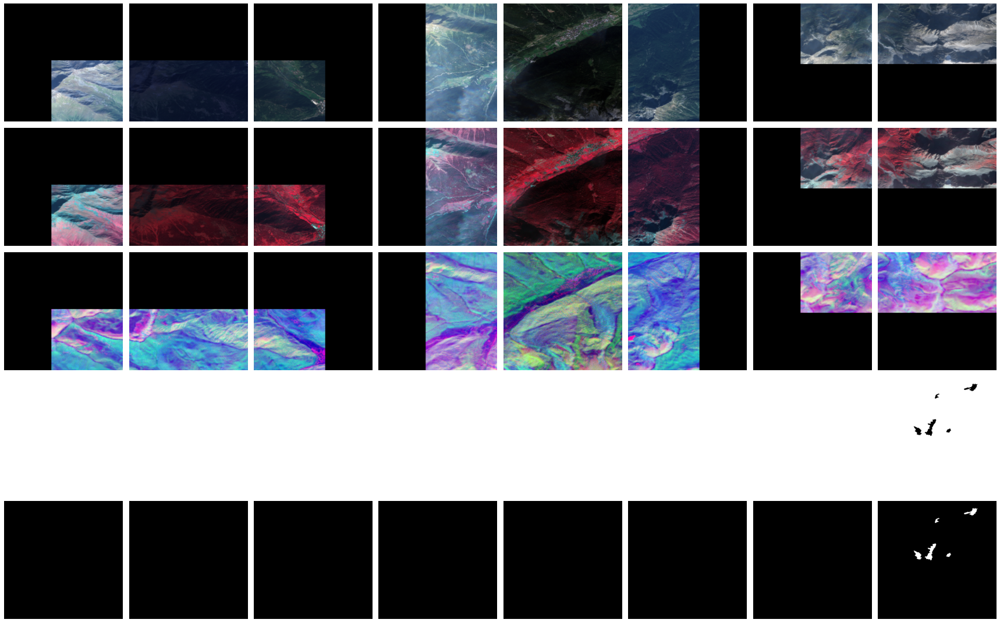

In [18]:
x_, y = val_sequence[0]
x = x_["optical"]
if val_sequence.mode > 0:
    x = np.concatenate((x, x_["dem"]), axis=-1)
if val_sequence.mode > 1:
    x = np.concatenate((x, x_["sar_intensities"], x_["sar_coherence"]), axis=-1)
nrows, ncols = 3 + CLASSES_COUNT, 8
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(3*ncols, 3*nrows))

for index, (x_item, y_item) in enumerate(zip(x, y)):
    axes[0][index].imshow(stretch_all()(x_item[:, :, [2, 1, 0]])) # visible
    axes[1][index].imshow(stretch_all()(x_item[:, :, [3, 2, 1]])) # false-color
    if val_sequence.mode > 1:
        axes[2][index].imshow(stretch_all()(x_item[:, :, [8, 10, 12]])) # sar features
    for row in range(3 + CLASSES_COUNT):
        axes[row][index].axis("off")
    for class_index in range(CLASSES_COUNT):
        axes[3 + class_index][index].imshow(y_item[:, :, class_index], cmap="gray", vmin=0, vmax=1)

plt.tight_layout()
plt.show()

In [19]:
del val_sequence

In [24]:
model = dlmodels.unet(
    {
        "optical": (None, None, 6),
        "dem": (None, None, 2),
        "sar_intensities": (None, None, 2)
    }, CLASSES_COUNT
)

model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 optical (InputLayer)           [(None, None, None,  0           []                               
                                 9)]                                                              
                                                                                                  
 dem (InputLayer)               [(None, None, None,  0           []                               
                                 2)]                                                              
                                                                                                  
 sar_intensities (InputLayer)   [(None, None, None,  0           []                               
                                 4)]                                                        

In [26]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[
        tf.keras.metrics.CategoricalAccuracy(),
        *[tf.keras.metrics.Precision(class_id=class_index) for class_index in range(CLASSES_COUNT)],
        *[tf.keras.metrics.Recall(class_id=class_index) for class_index in range(CLASSES_COUNT)]
    ]
)

In [27]:
training_callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        MODEL_PATH,
        monitor="val_loss",
        save_best_only=True
    ),
    tf.keras.callbacks.CSVLogger(
        f"{MODEL_PATH}.csv",
        append=True
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=21,
        verbose=1,
        restore_best_weights=True
    )
]

In [28]:
model.fit(
    TrainSequence(
        train_dataset, BATCH_SIZE, PATCH_SIZE, 250,
        transformations=[
            groundtruth_to_onehot(),
            stretch_features_to_range(MINS, MAXS),
            random_vertical_flip(p=0.5),
            random_horizontal_flip(p=0.5),
            random_rotation(p=0.5)
        ]
    ),
    epochs=500,
    validation_data=ValSequence(
        val_dataset, BATCH_SIZE, PATCH_SIZE, MINS,
        transformations=[
            groundtruth_to_onehot(),
            stretch_features_to_range(MINS, MAXS)
        ]
    ),
    callbacks=training_callbacks
)

Reading...


100%|███████████████████████████████████████████████████████████████| 178/178 [05:29<00:00,  1.85s/it]


Padding...


100%|███████████████████████████████████████████████████████████████| 178/178 [00:09<00:00, 18.76it/s]


Reading...


100%|█████████████████████████████████████████████████████████████████| 59/59 [01:45<00:00,  1.79s/it]


Padding...


100%|█████████████████████████████████████████████████████████████████| 59/59 [00:03<00:00, 19.14it/s]


Epoch 1/500


2022-06-14 09:51:24.717844: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8201
2022-06-14 09:51:26.050062: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-06-14 09:51:26.050620: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-06-14 09:51:26.050640: W tensorflow/stream_executor/gpu/asm_compiler.cc:80] Couldn't get ptxas version string: INTERNAL: Couldn't invoke ptxas --version
2022-06-14 09:51:26.051202: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-06-14 09:51:26.051281: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] INTERNAL: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.


250/250 [==============================] - 923s 4s/step - loss: 0.2081 - jaccard_loss: -0.4705 - categorical_accuracy: 0.9703 - precision: 0.9931 - precision_1: 0.6918 - recall: 0.9753 - recall_1: 0.8906 - val_loss: 0.1318 - val_jaccard_loss: -0.4851 - val_categorical_accuracy: 0.9928 - val_precision: 0.9944 - val_precision_1: 0.9421 - val_recall: 0.9981 - val_recall_1: 0.8473 - lr: 1.0000e-04
Epoch 2/500
250/250 [==============================] - 918s 4s/step - loss: 0.1033 - jaccard_loss: -0.5215 - categorical_accuracy: 0.9888 - precision: 0.9934 - precision_1: 0.9052 - recall: 0.9948 - recall_1: 0.8821 - val_loss: 0.0758 - val_jaccard_loss: -0.5233 - val_categorical_accuracy: 0.9936 - val_precision: 0.9951 - val_precision_1: 0.9492 - val_recall: 0.9983 - val_recall_1: 0.8651 - lr: 1.0000e-04
Epoch 3/500
250/250 [==============================] - 890s 4s/step - loss: 0.0736 - jaccard_loss: -0.5458 - categorical_accuracy: 0.9902 - precision: 0.9946 - precision_1: 0.9149 - recall: 0.99

250/250 [==============================] - 920s 4s/step - loss: 0.0184 - jaccard_loss: -0.6226 - categorical_accuracy: 0.9931 - precision: 0.9958 - precision_1: 0.9448 - recall: 0.9970 - recall_1: 0.9244 - val_loss: 0.0140 - val_jaccard_loss: -0.6017 - val_categorical_accuracy: 0.9946 - val_precision: 0.9960 - val_precision_1: 0.9530 - val_recall: 0.9984 - val_recall_1: 0.8916 - lr: 1.0000e-04
Epoch 22/500
250/250 [==============================] - 898s 4s/step - loss: 0.0180 - jaccard_loss: -0.6204 - categorical_accuracy: 0.9933 - precision: 0.9958 - precision_1: 0.9474 - recall: 0.9971 - recall_1: 0.9262 - val_loss: 0.0137 - val_jaccard_loss: -0.6037 - val_categorical_accuracy: 0.9948 - val_precision: 0.9965 - val_precision_1: 0.9465 - val_recall: 0.9981 - val_recall_1: 0.9039 - lr: 1.0000e-04
Epoch 23/500
250/250 [==============================] - 911s 4s/step - loss: 0.0176 - jaccard_loss: -0.6204 - categorical_accuracy: 0.9933 - precision: 0.9958 - precision_1: 0.9466 - recall: 0.

250/250 [==============================] - 889s 4s/step - loss: 0.0158 - jaccard_loss: -0.6309 - categorical_accuracy: 0.9936 - precision: 0.9961 - precision_1: 0.9479 - recall: 0.9972 - recall_1: 0.9298 - val_loss: 0.0121 - val_jaccard_loss: -0.6098 - val_categorical_accuracy: 0.9950 - val_precision: 0.9966 - val_precision_1: 0.9494 - val_recall: 0.9982 - val_recall_1: 0.9081 - lr: 1.0000e-04
Epoch 42/500
250/250 [==============================] - 901s 4s/step - loss: 0.0157 - jaccard_loss: -0.6323 - categorical_accuracy: 0.9937 - precision: 0.9962 - precision_1: 0.9505 - recall: 0.9972 - recall_1: 0.9337 - val_loss: 0.0123 - val_jaccard_loss: -0.6085 - val_categorical_accuracy: 0.9950 - val_precision: 0.9966 - val_precision_1: 0.9510 - val_recall: 0.9983 - val_recall_1: 0.9063 - lr: 1.0000e-04
Epoch 43/500
250/250 [==============================] - 895s 4s/step - loss: 0.0156 - jaccard_loss: -0.6317 - categorical_accuracy: 0.9938 - precision: 0.9961 - precision_1: 0.9503 - recall: 0.

250/250 [==============================] - 888s 4s/step - loss: 0.0141 - jaccard_loss: -0.6417 - categorical_accuracy: 0.9943 - precision: 0.9965 - precision_1: 0.9575 - recall: 0.9974 - recall_1: 0.9434 - val_loss: 0.0116 - val_jaccard_loss: -0.6138 - val_categorical_accuracy: 0.9953 - val_precision: 0.9971 - val_precision_1: 0.9436 - val_recall: 0.9980 - val_recall_1: 0.9220 - lr: 2.0000e-05
Epoch 61/500
250/250 [==============================] - 873s 4s/step - loss: 0.0137 - jaccard_loss: -0.6378 - categorical_accuracy: 0.9944 - precision: 0.9966 - precision_1: 0.9558 - recall: 0.9975 - recall_1: 0.9405 - val_loss: 0.0118 - val_jaccard_loss: -0.6129 - val_categorical_accuracy: 0.9952 - val_precision: 0.9967 - val_precision_1: 0.9530 - val_recall: 0.9984 - val_recall_1: 0.9088 - lr: 2.0000e-05
Epoch 62/500
250/250 [==============================] - 891s 4s/step - loss: 0.0131 - jaccard_loss: -0.6367 - categorical_accuracy: 0.9947 - precision: 0.9968 - precision_1: 0.9554 - recall: 0.

250/250 [==============================] - 884s 4s/step - loss: 0.0128 - jaccard_loss: -0.6384 - categorical_accuracy: 0.9948 - precision: 0.9968 - precision_1: 0.9569 - recall: 0.9977 - recall_1: 0.9423 - val_loss: 0.0117 - val_jaccard_loss: -0.6143 - val_categorical_accuracy: 0.9953 - val_precision: 0.9969 - val_precision_1: 0.9495 - val_recall: 0.9982 - val_recall_1: 0.9166 - lr: 4.0000e-06
Epoch 80/500
250/250 [==============================] - ETA: 0s - loss: 0.0131 - jaccard_loss: -0.6432 - categorical_accuracy: 0.9947 - precision: 0.9968 - precision_1: 0.9568 - recall: 0.9976 - recall_1: 0.9422
Epoch 00080: ReduceLROnPlateau reducing learning rate to 7.999999979801942e-07.
250/250 [==============================] - 893s 4s/step - loss: 0.0131 - jaccard_loss: -0.6432 - categorical_accuracy: 0.9947 - precision: 0.9968 - precision_1: 0.9568 - recall: 0.9976 - recall_1: 0.9422 - val_loss: 0.0116 - val_jaccard_loss: -0.6148 - val_categorical_accuracy: 0.9953 - val_precision: 0.9970 -

In [29]:
model = tf.keras.models.load_model(MODEL_PATH)

TODO: prediction on test tiles, performance evaluation, further refactoring, comments

In [30]:
transformations = [
    groundtruth_to_onehot(),
    stretch_features_to_range(MINS, MAXS)
]

with tqdm(total=len(test_tiles)) as pbar:
    for tile in test_tiles:
        tile_data = dataset[tile]

        optical = tile_data["optical"]
        height, width, _ = optical.shape
        stack = np.zeros((height, width, BANDS_COUNT + 1))
        stack[:, :, 0:6] = optical

        groundtruth = tile_data["groundtruth"]
        stack[:, :, -1] = groundtruth[:, :, 0]

        if MODE > 0:
            dem = tile_data["dem"]
            stack[:, :, 6] = dem[:, :, 0]
            slope = tile_data["slope"]
            stack[:, :, 7] = slope[:, :, 0]

        if MODE > 1:
            sar_asc = np.array(tile_data["sar_asc"])
            sar_desc = np.array(tile_data["sar_desc"])

            vv1, vh1, vv2, vh2 = calc_intensity(sar_asc)
            vv, vh = (vv1 + vv2) / 2, (vh1 + vh2) / 2
            stack[:, :, 8] = vv
            stack[:, :, 9] = vh

            vv1, vh1, vv2, vh2 = calc_intensity(sar_desc)
            vv, vh = (vv1 + vv2) / 2, (vh1 + vh2) / 2
            stack[:, :, 10] = vv
            stack[:, :, 11] = vh

            stack[:, :, 12] = calc_coherence(sar_asc, mode=0)
            stack[:, :, 13] = calc_coherence(sar_asc, mode=1)
            stack[:, :, 14] = calc_coherence(sar_desc, mode=0)
            stack[:, :, 15] = calc_coherence(sar_desc, mode=1)

        if MODE > 2:
            nir = stack[:, :, 3]
            red = stack[:, :, 2]
            green = stack[:, :, 1]
            swir1 = stack[:, :, 4]

            ndvi = (nir - red) / (nir + red + 1e-6)
            ndsi = (green - swir1) / (green + swir1 + 1e-6)
            ndwi = (green - nir) / (green + nir + 1e-6)

            stack[:, :, 16] = ndvi
            stack[:, :, 17] = ndsi
            stack[:, :, 18] = ndwi
        
        # coverage = calc_sar_mask(sar_asc, sar_desc)
        # stack[coverage] = 0

        stack = np.nan_to_num(stack)
        original_height, original_width, _ = stack.shape

        padding_y = (original_height // PATCH_SIZE + 1) * PATCH_SIZE - original_height
        padding_x = (original_width // PATCH_SIZE + 1) * PATCH_SIZE - original_width
        padding_y /= 2
        padding_x /= 2
        height = int(original_height + padding_y * 2)
        width = int(original_width + padding_x * 2)
        padding_y = int(padding_y)
        padding_x = int(padding_x)

        padded = np.zeros((height, width, BANDS_COUNT + 1))
        padded = np.concatenate((MINS[FEATURES_IDXS], [0]))[np.newaxis, np.newaxis, :]
        padded = np.repeat(padded, height, axis=0)
        padded = np.repeat(padded, width, axis=1)
        
        predicted = np.zeros((height, width, CLASSES_COUNT))
        padded[padding_y:padding_y+original_height, padding_x:padding_x+original_width, :] = stack

        #y = 0
        #while y + PATCH_SIZE <= height:
        #    x = 0
        #    while x + PATCH_SIZE <= width:
        #        patch = padded[y:y+PATCH_SIZE, x:x+PATCH_SIZE, :]
        #        for transform in transformations:
        #            patch = transform(patch)
        #        patch_x = patch[:, :, :-CLASSES_COUNT]
        #        predicted_patch = model.predict(np.array([patch_x]))[0]
        #        predicted[y:y+PATCH_SIZE, x:x+PATCH_SIZE, :] = predicted[y:y+PATCH_SIZE, x:x+PATCH_SIZE, :] + predicted_patch
        #        x += PATCH_SIZE // 2
        #    y += PATCH_SIZE // 2
                           
        for transform in transformations:
            padded = transform(padded)
        
        inputs = {}
        inputs["optical"] = np.array([padded[:, :, OPTICAL_IDXS]])
        if MODE > 0:
            inputs["dem"] = np.array([padded[:, :, DEM_IDXS]])
        if MODE > 1:
            inputs["sar_intensities"] = np.array([padded[:, :, SAR_INTENSITIES_IDXS]])
            inputs["sar_coherence"] = np.array([padded[:, :, SAR_COHERENCE_IDXS]])
        if MODE > 2:
            inputs["optical"] = np.array([padded[:, :, OPTICAL_IDXS + SPECTRAL_INDICES_IDXS]])
                            
        predicted = model.predict(inputs)[0]
        predicted = np.argmax(predicted, axis=-1)

        predicted = predicted[padding_y:padding_y+original_height, padding_x:padding_x+original_width]

        with h5py.File(os.path.join("predictions", "predictions.hdf5"), "a") as predictions:
            if tile not in predictions.keys():
                group = predictions.create_group(tile)
                rgb = stretch_all()(
                    padded[padding_y:padding_y+original_height, padding_x:padding_x+original_width, [2, 1, 0]]
                )
                ground_truth = stack[:, :, -1]
                group.create_dataset("rgb", data=rgb)
                group.create_dataset("groundtruth", data=ground_truth)
            else:
                group = predictions[tile]
            group.create_dataset(f"lightunet{MODE}", data=predicted)
                            
        pbar.update(1)

100%|█████████████████████████████████████████████████████████████████| 60/60 [02:37<00:00,  2.63s/it]


In [11]:
rgb_ = rgb.copy()
rgb_[rgb_ < 0] = 0
rgb_[rgb_ > 1] = 1
mpl.image.imsave(f"{group}--{date}--rgb.png", rgb_, vmin=0., vmax=0.6)

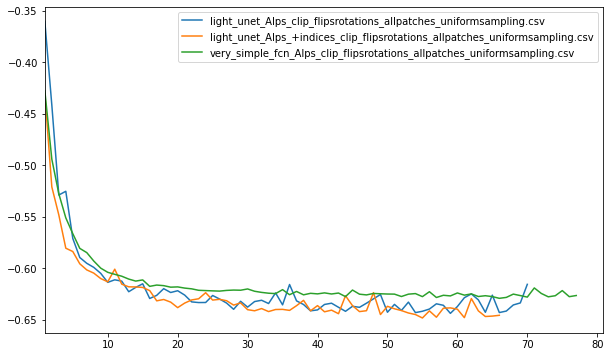

In [12]:
files_to_plot = [
    "light_unet_Alps_clip_flipsrotations_allpatches_uniformsampling.csv",
    "light_unet_Alps_+indices_clip_flipsrotations_allpatches_uniformsampling.csv",
    "very_simple_fcn_Alps_clip_flipsrotations_allpatches_uniformsampling.csv",
    # "light_unet_crossentropy_Alps_clip_flipsrotations_allpatches_uniformsampling.csv"
]

plt.figure(figsize=(10, 6))

for filename in files_to_plot:
    df = pandas.read_csv(filename)
    val_loss = df["val_loss"]
    epochs = list(range(1, len(val_loss) + 1))
    plt.plot(epochs, val_loss, label=filename)

plt.xlim(left=1)
plt.legend()
plt.show()